# Geometric & Intensity Transformations


Apply classical image processing operations using Python and the `(PIL)` library. Complete both tasks and save your output images for comparison.


In [1]:
# Import the library
from PIL import Image, ImageOps
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

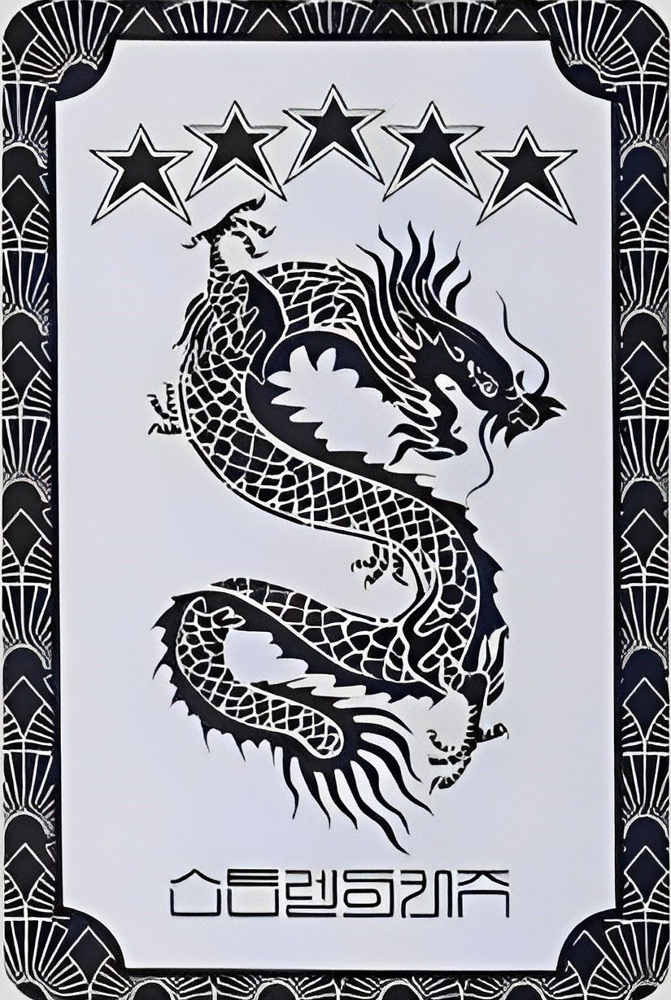

In [2]:
# ── Load image ────────────────────────────────────
image = Image.open("Dragon.jpg")
image

### 1. Scale (increase size)
Double the image dimensions using `Image.resize()` with high-quality resampling `(LANCZOS)`.

In [3]:
# Get the size of the image
width, height = image.size
print(f"Original size: {width}x{height}")
# scaling factors
scale_x = 2
scale_y = 2

Original size: 825x1228


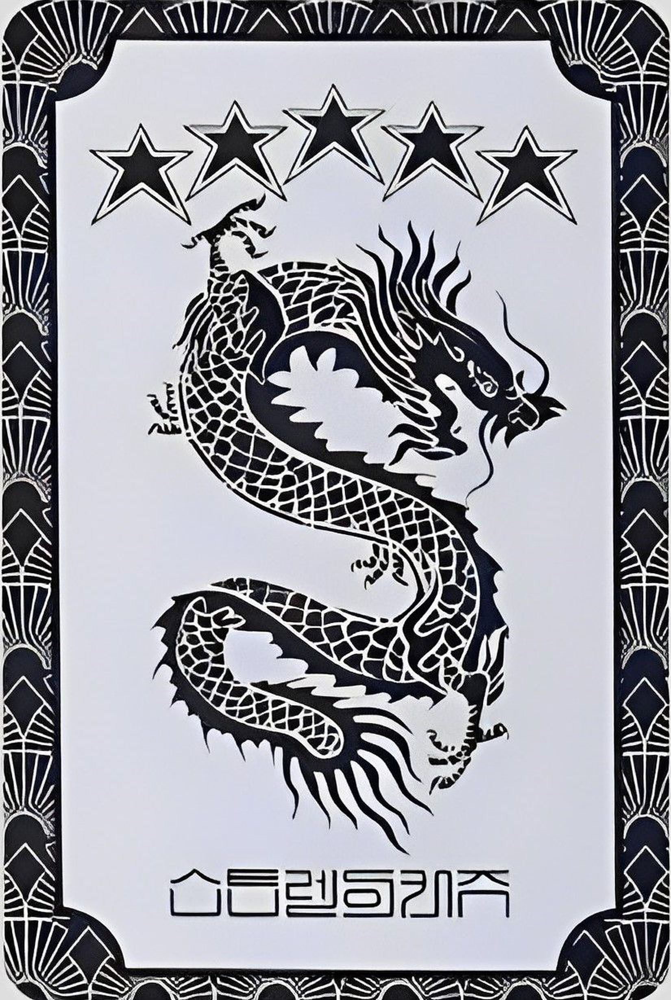

In [4]:
# ── 1. Increase size (scale ×2) ────────────────────

# Resize the image using PIL's built-in method
new_width = int(width * scale_x)
new_height = int(height * scale_y)
scaled_image = image.resize((new_width, new_height), Image.Resampling.LANCZOS)
scaled_image

In [5]:
# Save the scaled image and print the sizes (The new image name should be "task1_1_scaled.jpg")
scaled_image.save("task1_1_scaled.jpg")
print(f"Original size: {width}x{height}")
print(f"Scaled size: {scaled_image.size}")

Original size: 825x1228
Scaled size: (1650, 2456)


 non-uniform scale (cx=2, cy=1) → stretch horizontally only

In [6]:
# Non-uniform scaling factors
cx, cy = 2, 1  
new_width_nu = int(width * cx)
new_height_nu = int(height * cy)
print(f"Non-uniform scaled size: {new_width_nu}x{new_height_nu}")

Non-uniform scaled size: 1650x1228


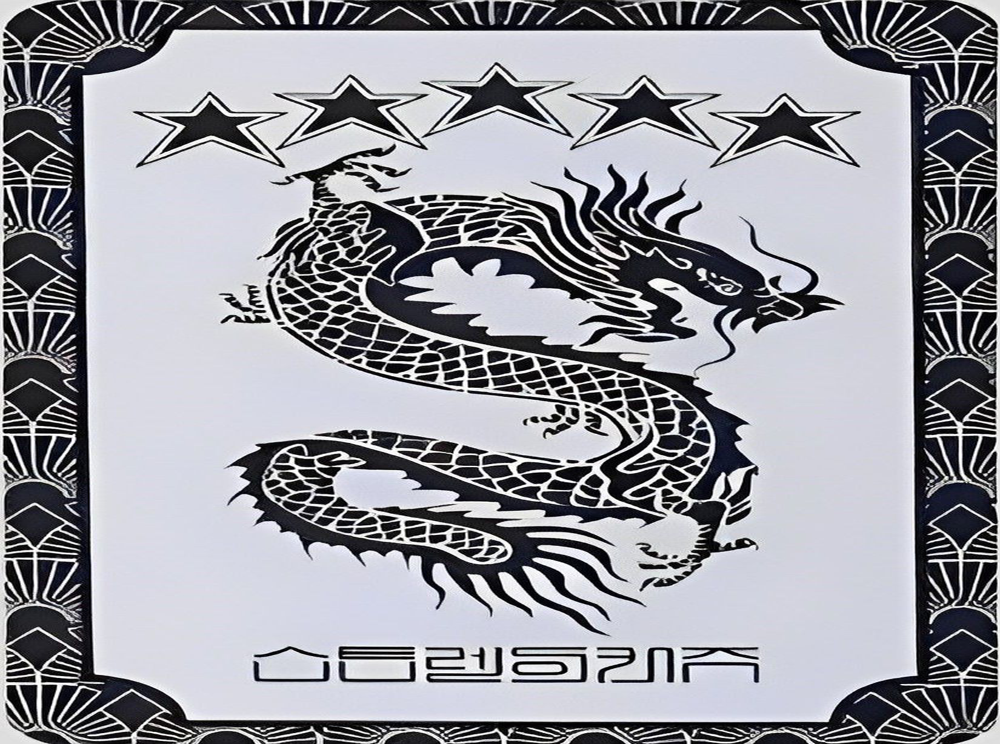

In [7]:
# Apply the non-uniform scale
scaled_image_nu = image.resize((new_width_nu, new_height_nu), Image.Resampling.LANCZOS)
scaled_image_nu

In [8]:
# Save the non-uniform scaled image and print the sizes
scaled_image_nu.save("task1_1b_nonuniform_scaled.jpg")
print(f"Original size: {width}x{height}")
print(f"Non-uniform scaled size: {scaled_image_nu.size}")

Original size: 825x1228
Non-uniform scaled size: (1650, 1228)


### 2. Rotate 120°
Rotate the image by 120 degrees, expanding the canvas to fit the full rotated image.

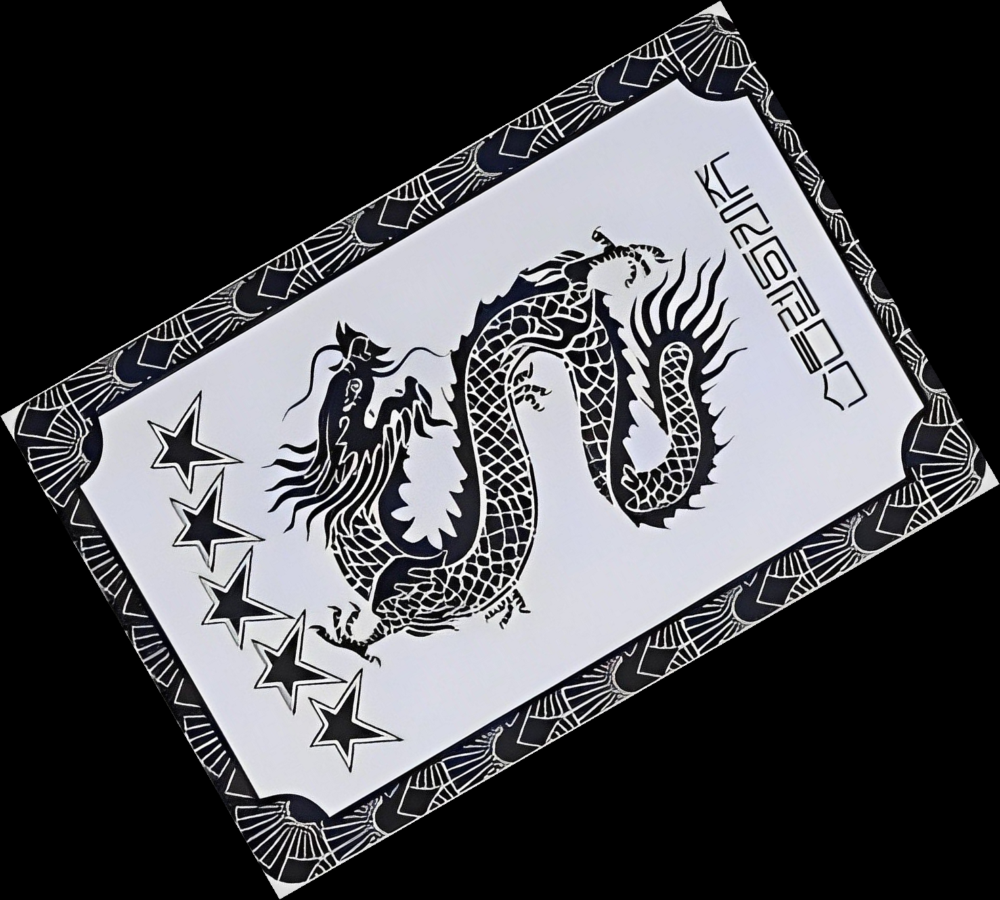

In [9]:
# ── 2. Rotate 120 degrees ──────────────────────────
rotated_image = image.rotate(120, expand=True, resample=Image.Resampling.BICUBIC)
rotated_image

In [10]:
# Save the scaled image and print the sizes (The new image name should be "task1_2_rotated.jpg")
rotated_image.save("task1_2_rotated.jpg")
print(f"Original size: {width}x{height}")
print(f"Rotated size: {rotated_image.size}")

Original size: 825x1228
Rotated size: (1477, 1330)


### 3. Shear

### Experiment and compare
Try these:

— Change shear factor from 0.5 to 0.1, 0.3, 0.8 and compare results

— Switch from X-axis to Y-axis shear matrix

— Update the canvas multiplier to match your new factor

— Try combining X and Y shear in one matrix

In [11]:
# -- c. Get the image dimensions ────────────────────
width, height = image.size
print(f"Original size: {width}x{height}")

Original size: 825x1228


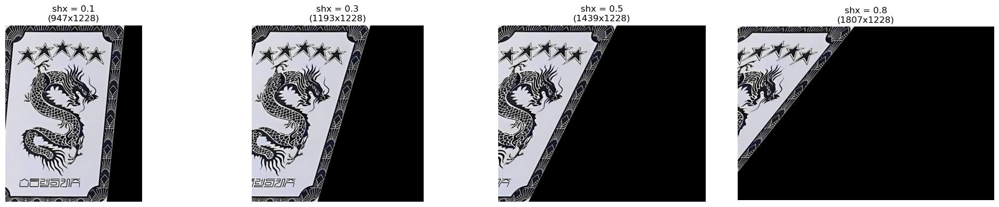

In [12]:
# -- d. define the shear matrix ──────────────────────────
# Choose X-axis or Y-axis shear. The shear factor controls how much the image slants — start with 0.5 then experiment.
shear_factors = [0.1, 0.3, 0.5, 0.8]

plt.figure(figsize=(20, 4))
for i, sf in enumerate(shear_factors, start=1):
    shx, shy = sf, 0
    new_w = int(width + abs(shx) * height)
    new_h = height
    tx = -shx * height if shx < 0 else 0
    matrix = (1, shx, tx, shy, 1, 0)

    sheared = image.transform((new_w, new_h), Image.AFFINE, matrix, resample=Image.Resampling.BICUBIC)

    plt.subplot(1, len(shear_factors), i)
    plt.imshow(sheared)
    plt.title(f'shx = {sf}\n({sheared.size[0]}x{sheared.size[1]})')
    plt.axis('off')

plt.tight_layout()
plt.show()

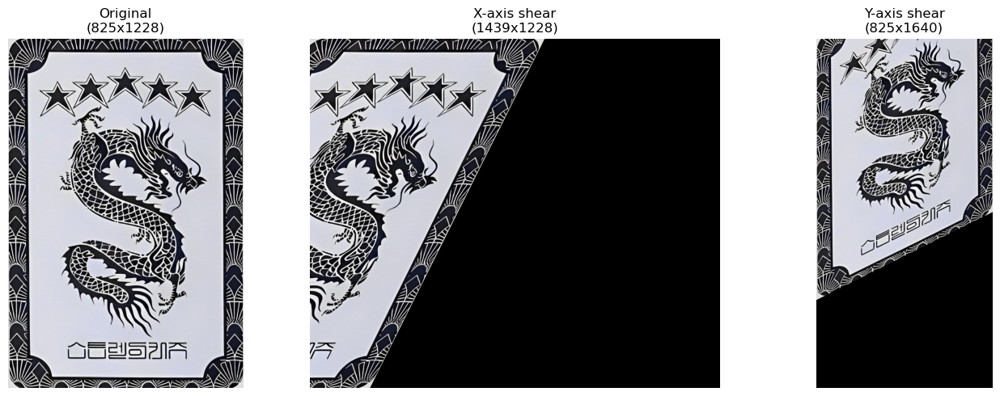

In [13]:
# -- e. Apply the shear transformation to the image ──────────────────────────
# PIL's transform() takes the inverse affine matrix:
# [ 1    shx   tx ]
# [ shy  1     ty ]
shear_factor = 0.5

# X-axis shear
shx, shy = shear_factor, 0
new_w_x = int(width + abs(shx) * height)
new_h_x = height
tx = -shx * height if shx < 0 else 0
matrix_x = (1, shx, tx, shy, 1, 0)
sheared_x = image.transform((new_w_x, new_h_x), Image.AFFINE, matrix_x, resample=Image.Resampling.BICUBIC)

# Y-axis shear
shx, shy = 0, shear_factor
new_w_y = width
new_h_y = int(height + abs(shy) * width)
ty = -shy * width if shy < 0 else 0
matrix_y = (1, shx, 0, shy, 1, ty)
sheared_y = image.transform((new_w_y, new_h_y), Image.AFFINE, matrix_y, resample=Image.Resampling.BICUBIC)

# Compare all three
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1), plt.imshow(image), plt.title(f'Original\n({width}x{height})'), plt.axis('off')
plt.subplot(1, 3, 2), plt.imshow(sheared_x), plt.title(f'X-axis shear\n({sheared_x.size[0]}x{sheared_x.size[1]})'), plt.axis('off')
plt.subplot(1, 3, 3), plt.imshow(sheared_y), plt.title(f'Y-axis shear\n({sheared_y.size[0]}x{sheared_y.size[1]})'), plt.axis('off')
plt.tight_layout()
plt.show()

In [14]:
shx, shy = 0.5, 0.3  

new_w = int(width + abs(shx) * height)   # X-shear: canvas widens by shx * height
new_h = int(height + abs(shy) * width)   # Y-shear: canvas grows by shy * width

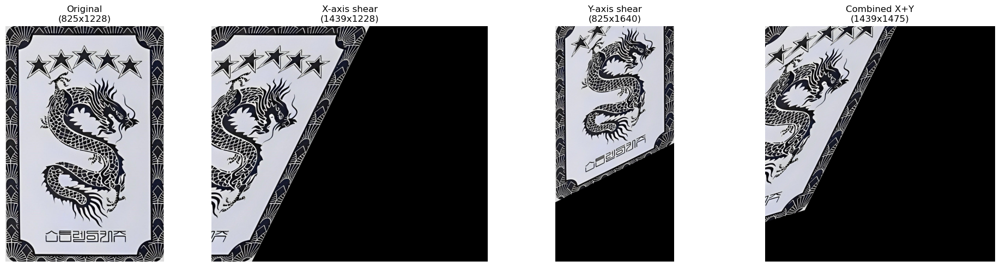

In [15]:
tx = -shx * height if shx < 0 else 0
ty = -shy * width if shy < 0 else 0
matrix = (1, shx, tx, shy, 1, ty)

sheared_x = image.transform((new_w_x, new_h_x), Image.AFFINE, matrix_x, resample=Image.Resampling.BICUBIC)
sheared_y = image.transform((new_w_y, new_h_y), Image.AFFINE, matrix_y, resample=Image.Resampling.BICUBIC)
sheared_xy = image.transform((new_w, new_h), Image.AFFINE, matrix, resample=Image.Resampling.BICUBIC)

plt.figure(figsize=(20, 5))
plt.subplot(1, 4, 1), plt.imshow(image), plt.title(f'Original\n({width}x{height})'), plt.axis('off')
plt.subplot(1, 4, 2), plt.imshow(sheared_x), plt.title(f'X-axis shear\n({sheared_x.size[0]}x{sheared_x.size[1]})'), plt.axis('off')
plt.subplot(1, 4, 3), plt.imshow(sheared_y), plt.title(f'Y-axis shear\n({sheared_y.size[0]}x{sheared_y.size[1]})'), plt.axis('off')
plt.subplot(1, 4, 4), plt.imshow(sheared_xy), plt.title(f'Combined X+Y\n({sheared_xy.size[0]}x{sheared_xy.size[1]})'), plt.axis('off')
plt.tight_layout()
plt.show()

In [17]:
# Save the sheared image and print the sizes
sheared_xy.save("task1_3_sheared.jpg")
print(f"Original size: {width}x{height}")
print(f"Sheared size: {sheared_image.size}")

Original size: 825x1228


NameError: name 'sheared_image' is not defined

# Intensity Transformations
Negative · Log · Power Law (Gamma)

In [ ]:
# ── 1. Negative ──────────────────────────────────── 
# Method 1: NumPy array manipulation
img_array = np.array(image)
negative_array = 255 - img_array
negative_image_np = Image.fromarray(negative_array.astype(np.uint8))

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1), plt.imshow(image), plt.title('Original'), plt.axis('off')
plt.subplot(1, 2, 2), plt.imshow(negative_image_np), plt.title('Negative (NumPy)'), plt.axis('off')
plt.show()

In [ ]:
# Method 2: PIL's ImageOps
negative_image_pil = ImageOps.invert(image.convert('RGB'))

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1), plt.imshow(image), plt.title('Original'), plt.axis('off')
plt.subplot(1, 2, 2), plt.imshow(negative_image_pil), plt.title('Negative (ImageOps)'), plt.axis('off')
plt.show()

In [ ]:
# ── 2. Log transformation ──────────────────────────

# s = c · log(1 + r) --> We need to find c.
# We want the maximum output value (s) to be 255 when the maximum input value (r) is 255:
# 255 = c · log(1 + 255)
# c = 255 / log(1 + 255)
img_array = np.array(image).astype(np.float64)
c = 255 / np.log(1 + 255)

# Apply the log transformation to each pixel
log_image_array = c * np.log(1 + img_array)
log_image_array = np.clip(log_image_array, 0, 255).astype(np.uint8)
log_image = Image.fromarray(log_image_array)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1), plt.imshow(image), plt.title('Original'), plt.axis('off')
plt.subplot(1, 2, 2), plt.imshow(log_image), plt.title('Log Transform'), plt.axis('off')
plt.show()

In [ ]:
# ── 3. Power-law / Gamma correction ───────────────
gamma_values = [0.4, 1.0, 2.5]
img_norm = np.array(image).astype(np.float64) / 255.0

plt.figure(figsize=(15, 4))
gamma_images = {}
for i, gamma in enumerate(gamma_values, start=1):
    gamma_corrected = np.power(img_norm, gamma)
    gamma_image = Image.fromarray((gamma_corrected * 255).astype(np.uint8))
    gamma_images[gamma] = gamma_image
    plt.subplot(1, len(gamma_values), i)
    plt.imshow(gamma_image)
    plt.title(f'Gamma = {gamma}')
    plt.axis('off')

plt.tight_layout()
plt.show()